In [1]:
import os
import numpy as np
import cv2 as cv
import torch
import matplotlib.pyplot as plt

from torch import nn
from torch.utils.data import Dataset, DataLoader
from tqdm import tqdm
from torchvision.utils import make_grid
from PIL import Image
from torchvision import transforms as T
from torch.optim import Adam
from torch.distributions import Uniform

# Dataset

In [2]:
class AnimeFacesDataset(Dataset):
    def __init__(self, root_dir, transform = None):
        super().__init__()
        self.root_dir = root_dir;
        self.img_filename_list = []
        for i in os.listdir(root_dir):
            if i.endswith('.png') or i.endswith('.jpg') or i.endswith('.jpeg'):
                self.img_filename_list.append(i)

        self.transform = transform;
        
    def __len__(self):
        return len(self.img_filename_list)
    
    def __getitem__(self, idx):
        filename = os.path.join(self.root_dir, self.img_filename_list[idx])
        
        rgb_image = Image.open(filename)

        gray_image = rgb_image.convert("L")
        
        if self.transform:
            gray_image, rgb_image = self.transform(gray_image), self.transform(rgb_image)
        
        return gray_image, rgb_image

In [3]:
# dataset = AnimeFacesDataset('/kaggle/input/animefacedataset/images')
# gray, rgb = dataset.__getitem__(1)
# rgb

# Discriminator

In [4]:
class ConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = True):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = padding, bias = bias)
        self.norm = nn.BatchNorm2d(out_channels)
        self.act = nn.LeakyReLU(0.2, inplace = True)
        
    def forward(self, x):
        x = self.conv(x)
        x = self.norm(x)
        x = self.act(x)
        return x

class Discriminator(nn.Module):
    def __init__(self, in_channels = 4, out_channels = 1, first_hidden_channels = 64):
        super().__init__()
        
        self.conv1 = ConvLayer(in_channels, first_hidden_channels)
        self.conv2 = ConvLayer(first_hidden_channels, first_hidden_channels * 2)
        self.conv3 = ConvLayer(first_hidden_channels * 2, first_hidden_channels * 4)
        self.conv4 = ConvLayer(first_hidden_channels * 4, first_hidden_channels * 8)
        self.out = nn.Conv2d(first_hidden_channels * 8, out_channels, 4, 2, 0)
        self.act = nn.Sigmoid()
        
    def forward(self, x, y):
        x = torch.cat([x,y], dim = 1)
        x = self.conv1(x)
        x = self.conv2(x)
        x = self.conv3(x)        
        x = self.conv4(x)
        x = self.out(x)
        return self.act(x)

# Generator

In [5]:
class DeConvLayer(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size = 4, stride = 2, padding = 1, bias = True):
        super().__init__()
        
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size = kernel_size, stride = stride, padding = padding, bias = bias)
        self.norm = nn.BatchNorm2d(out_channels)
        self.act = nn.ReLU()
        
    def forward(self, x):
        x = self.deconv(x)
        x = self.norm(x)
        return self.act(x)
    

class Generator(nn.Module):
    def __init__(self, in_channels = 1, step_channels = 64, out_channels = 3):
        super().__init__()
        
        self.conv1 = ConvLayer(in_channels, step_channels)
        self.conv2 = ConvLayer(step_channels, step_channels * 2)
        self.conv3 = ConvLayer(step_channels * 2, step_channels * 4)
        self.conv4 = ConvLayer(step_channels * 4, step_channels * 8)
        
        self.deconv1 = DeConvLayer(step_channels * 8, step_channels * 4, 4, 2, 1)
        self.deconv2 = DeConvLayer(step_channels * 8, step_channels * 2)
        self.deconv3 = DeConvLayer(step_channels * 4, step_channels * 1)
        
        self.deconv4 = nn.ConvTranspose2d(step_channels * 2, out_channels, 4, 2, 1)
        
        self.out = nn.Sigmoid()
        
    def forward(self, x):
        x1 = self.conv1(x)
        x2 = self.conv2(x1)
        x3 = self.conv3(x2)
        x4 = self.conv4(x3)
        
        x = self.deconv1(x4)
        x = torch.cat([x, x3], dim = 1)
        
        x = self.deconv2(x)
        x = torch.cat([x, x2], dim = 1)
        
        x = self.deconv3(x)
        x = torch.cat([x, x1], dim = 1)
        
        x = self.deconv4(x)
        return self.out(x)

# Parameters

In [6]:
root_dir = '/kaggle/input/animefacedataset/images'
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
img_size = 64
batch_size = 512
num_workers = os.cpu_count()

real_label = 1.
fake_label = 0.

lr = 0.0001
beta1 = 0.5
lambda_weight = 100

# DataLoader

In [7]:
transform = T.Compose(
    [
        T.Resize((img_size, img_size)),
        T.ToTensor(),
#         T.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225]),
    ]
)

train_dataset = AnimeFacesDataset(root_dir, transform)
train_dataloader = DataLoader(train_dataset, batch_size = batch_size, shuffle = True, num_workers = num_workers, drop_last = True)

# Model

In [8]:
dis_model = Discriminator().to(device)
gen_model = Generator().to(device)

dis_optim = Adam(dis_model.parameters(), lr = lr, betas = (0.5, 0.999))
gen_optim = Adam(gen_model.parameters(), lr = lr, betas = (0.5, 0.999))

BECLoss_func = nn.BCELoss()
L1Loss_func = nn.L1Loss()

# Train model

Text(0.5, 1.0, 'Sample output')

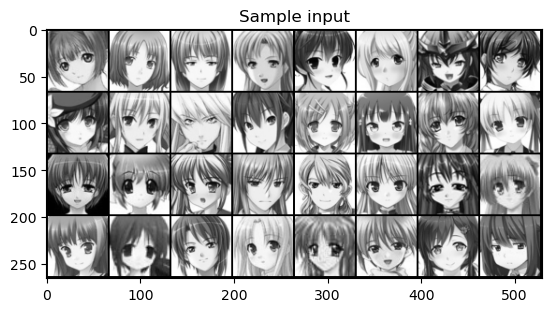

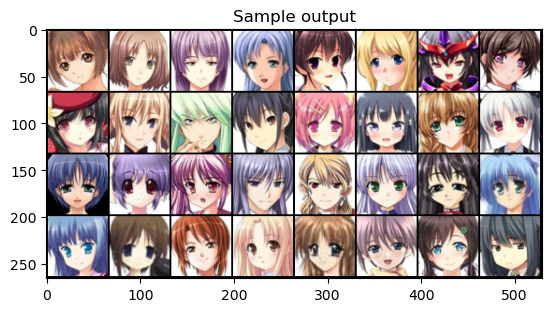

In [9]:
img_list = []
epochs = 100

for data in train_dataloader:
    fixed_input, fixed_output = data
    break
    
sample_output = make_grid(fixed_output[:32], padding = 2, nrow = 8)
sample_input = make_grid(fixed_input[:32], padding = 2, nrow = 8)
plt.figure(figsize = (10,10))
plt.imshow(sample_input.permute((1,2,0)))
plt.title("Sample input")
plt.figure(figsize = (10,10))
plt.imshow(sample_output.permute((1,2,0)))
plt.title("Sample output")


Epoch 1/100: 100%|████████████████████████████████████████████████| 124/124 [04:18<00:00,  2.09s/it]


Epoch: 1/100: D Loss:  13.2153, G loss:  13.0418


Epoch 2/100: 100%|████████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 2/100: D Loss:  7.3624, G loss:  7.1601


Epoch 3/100: 100%|████████████████████████████████████████████████| 124/124 [01:20<00:00,  1.53it/s]


Epoch: 3/100: D Loss:  6.6176, G loss:  6.4171


Epoch 4/100: 100%|████████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 4/100: D Loss:  6.3081, G loss:  6.1147


Epoch 5/100: 100%|████████████████████████████████████████████████| 124/124 [01:20<00:00,  1.55it/s]


Epoch: 5/100: D Loss:  6.1286, G loss:  5.9532


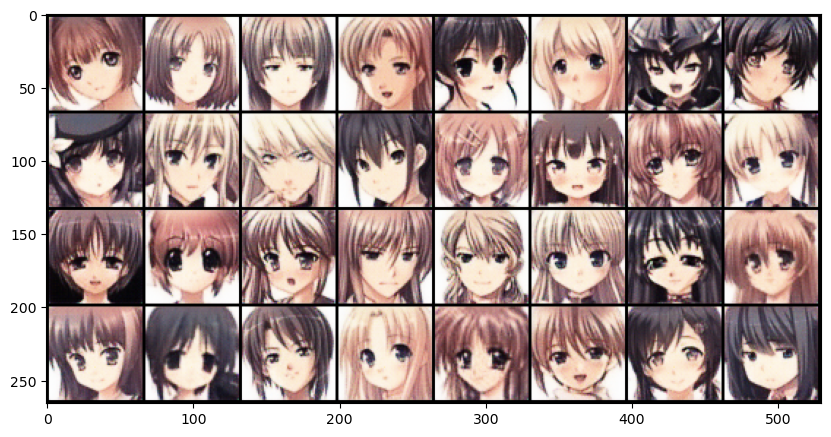

Epoch 6/100: 100%|████████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 6/100: D Loss:  5.9340, G loss:  5.7419


Epoch 7/100: 100%|████████████████████████████████████████████████| 124/124 [01:20<00:00,  1.53it/s]


Epoch: 7/100: D Loss:  5.7749, G loss:  5.5747


Epoch 8/100: 100%|████████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 8/100: D Loss:  5.6586, G loss:  5.4592


Epoch 9/100: 100%|████████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 9/100: D Loss:  5.5032, G loss:  5.3035


Epoch 10/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.48it/s]


Epoch: 10/100: D Loss:  5.3772, G loss:  5.1777


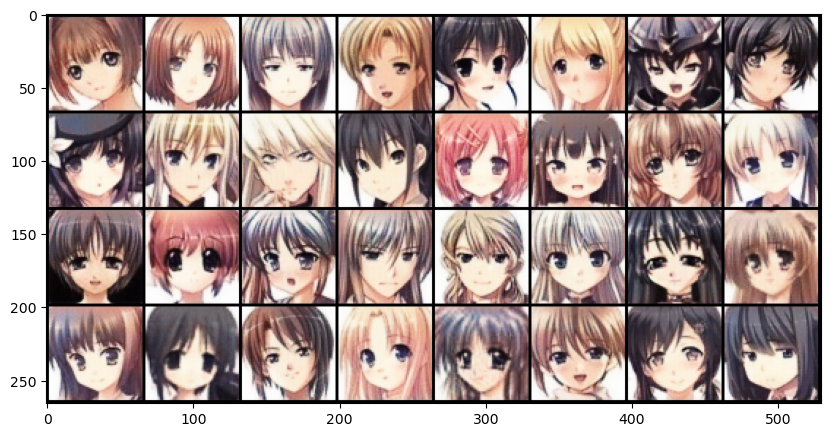

Epoch 11/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 11/100: D Loss:  5.2797, G loss:  5.0812


Epoch 12/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 12/100: D Loss:  5.1125, G loss:  4.9114


Epoch 13/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 13/100: D Loss:  4.9626, G loss:  4.7619


Epoch 14/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 14/100: D Loss:  4.8248, G loss:  4.6238


Epoch 15/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.48it/s]


Epoch: 15/100: D Loss:  4.6942, G loss:  4.4944


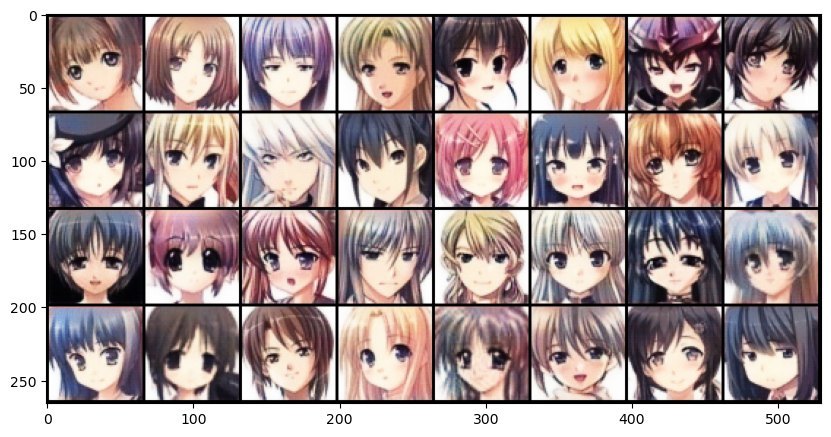

Epoch 16/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 16/100: D Loss:  4.5723, G loss:  4.3719


Epoch 17/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 17/100: D Loss:  4.4504, G loss:  4.2491


Epoch 18/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.53it/s]


Epoch: 18/100: D Loss:  4.4611, G loss:  4.2628


Epoch 19/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 19/100: D Loss:  4.2607, G loss:  4.0617


Epoch 20/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 20/100: D Loss:  4.2326, G loss:  4.0371


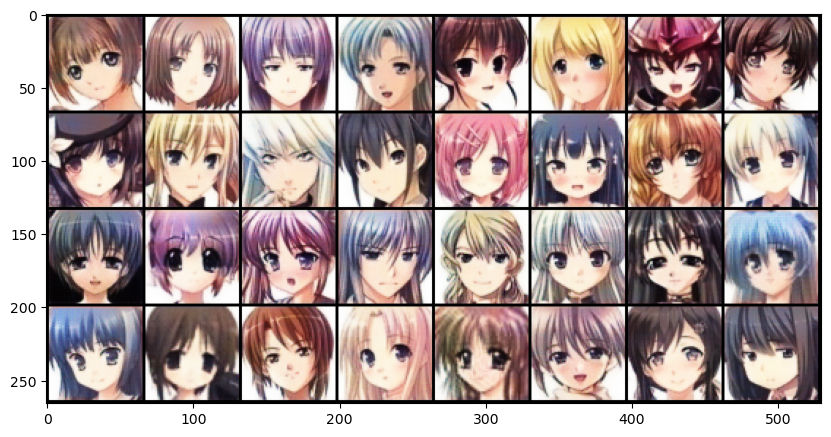

Epoch 21/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.49it/s]


Epoch: 21/100: D Loss:  4.0758, G loss:  3.8759


Epoch 23/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.53it/s]


Epoch: 23/100: D Loss:  3.9408, G loss:  3.7408


Epoch 24/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 24/100: D Loss:  3.9884, G loss:  3.7933


Epoch 25/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 25/100: D Loss:  3.8208, G loss:  3.6189


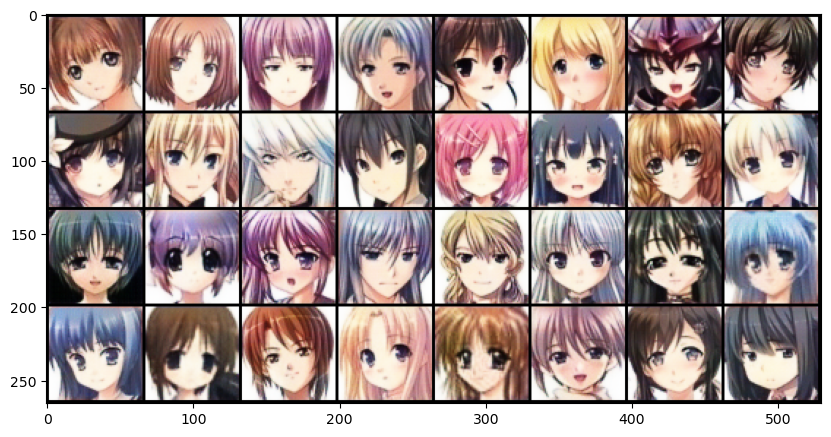

Epoch 26/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.51it/s]


Epoch: 26/100: D Loss:  3.7764, G loss:  3.5753


Epoch 27/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 27/100: D Loss:  3.6921, G loss:  3.4921


Epoch 28/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 28/100: D Loss:  3.6521, G loss:  3.4510


Epoch 29/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 29/100: D Loss:  3.5968, G loss:  3.3965


Epoch 30/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.48it/s]


Epoch: 30/100: D Loss:  3.6031, G loss:  3.4069


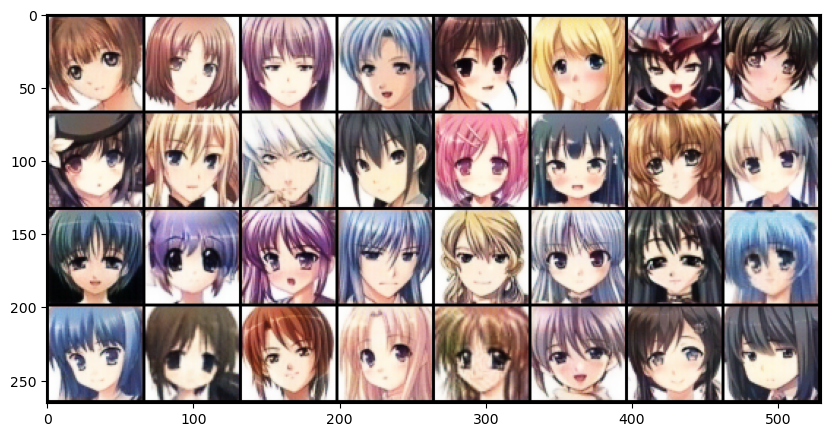

Epoch 31/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 31/100: D Loss:  3.5220, G loss:  3.3201


Epoch 32/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 32/100: D Loss:  3.4762, G loss:  3.2752


Epoch 33/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 33/100: D Loss:  3.4569, G loss:  3.2559


Epoch 34/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 34/100: D Loss:  3.6627, G loss:  3.4693


Epoch 35/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 35/100: D Loss:  3.4043, G loss:  3.2044


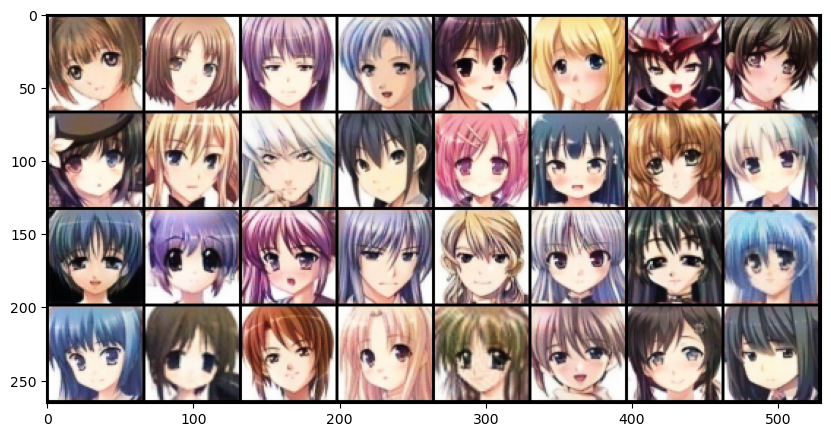

Epoch 36/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 36/100: D Loss:  3.3524, G loss:  3.1514


Epoch 37/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 37/100: D Loss:  3.3171, G loss:  3.1171


Epoch 38/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 38/100: D Loss:  3.2981, G loss:  3.0983


Epoch 39/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 39/100: D Loss:  3.2654, G loss:  3.0660


Epoch 40/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 40/100: D Loss:  3.3232, G loss:  3.0673


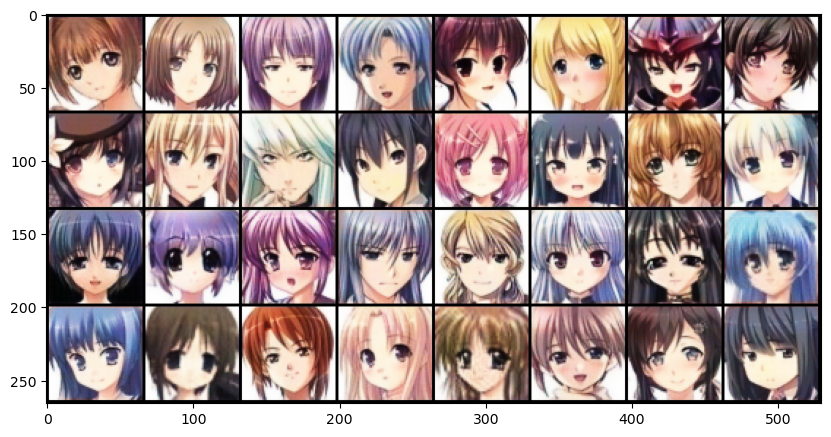

Epoch 41/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 41/100: D Loss:  3.2292, G loss:  3.0268


Epoch 42/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 42/100: D Loss:  3.2008, G loss:  2.9999


Epoch 43/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 43/100: D Loss:  3.1862, G loss:  2.9861


Epoch 44/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.53it/s]


Epoch: 44/100: D Loss:  3.1495, G loss:  2.9494


Epoch 45/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 45/100: D Loss:  3.1261, G loss:  2.9266


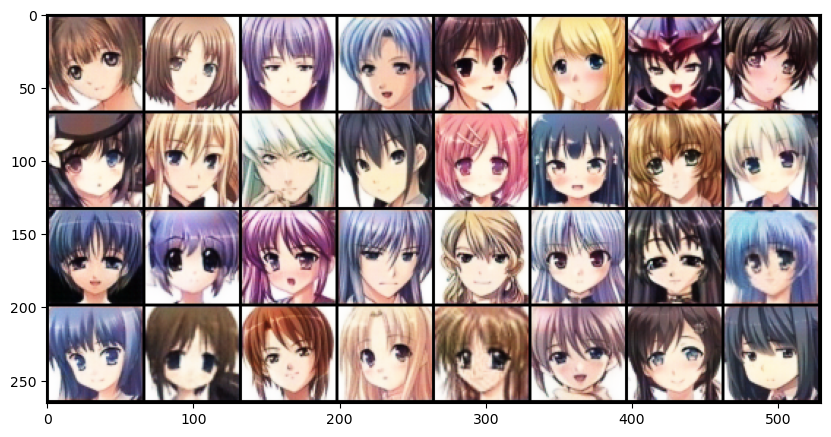

Epoch 46/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.54it/s]


Epoch: 46/100: D Loss:  3.1985, G loss:  2.9547


Epoch 47/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.51it/s]


Epoch: 47/100: D Loss:  3.1053, G loss:  2.9033


Epoch 48/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.54it/s]


Epoch: 48/100: D Loss:  3.0826, G loss:  2.8822


Epoch 49/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.53it/s]


Epoch: 49/100: D Loss:  3.0664, G loss:  2.8661


Epoch 50/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.53it/s]


Epoch: 50/100: D Loss:  3.0429, G loss:  2.8418


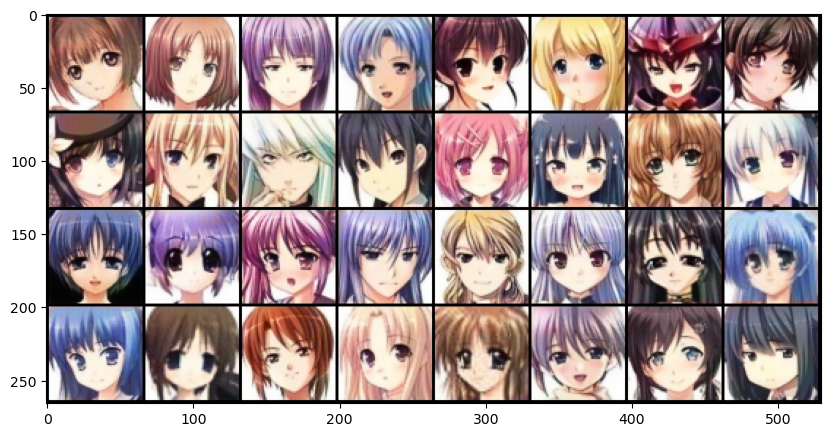

Epoch 51/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 51/100: D Loss:  3.0226, G loss:  2.8229


Epoch 53/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 53/100: D Loss:  2.9970, G loss:  2.7969


Epoch 54/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 54/100: D Loss:  2.9738, G loss:  2.7739


Epoch 55/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.53it/s]


Epoch: 55/100: D Loss:  2.9541, G loss:  2.7545


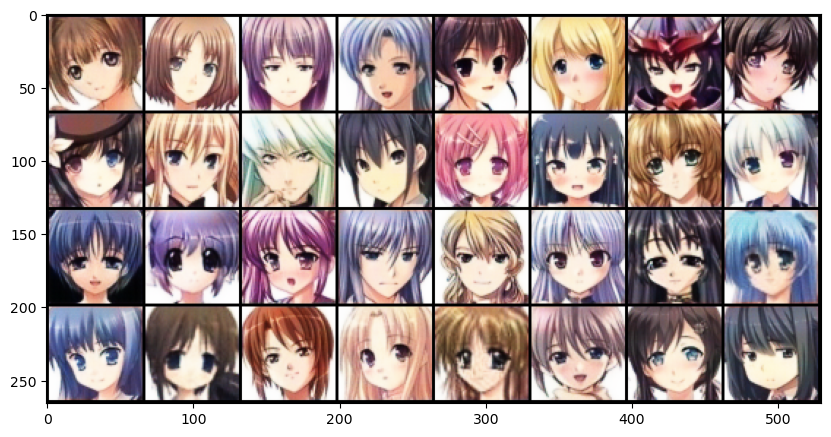

Epoch 56/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 56/100: D Loss:  2.9520, G loss:  2.7528


Epoch 57/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.51it/s]


Epoch: 57/100: D Loss:  2.9318, G loss:  2.7319


Epoch 58/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.54it/s]


Epoch: 58/100: D Loss:  2.9260, G loss:  2.7264


Epoch 59/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.54it/s]


Epoch: 59/100: D Loss:  2.9126, G loss:  2.7123


Epoch 60/100: 100%|███████████████████████████████████████████████| 124/124 [01:20<00:00,  1.53it/s]


Epoch: 60/100: D Loss:  2.9041, G loss:  2.7047


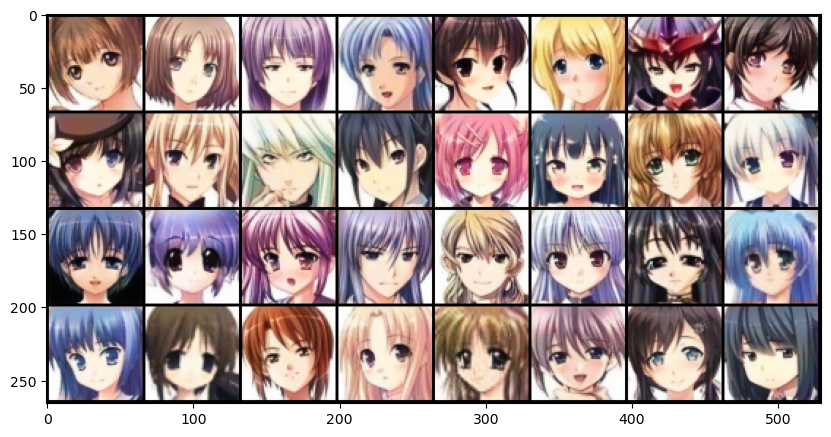

Epoch 61/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 61/100: D Loss:  2.8888, G loss:  2.6896


Epoch 62/100: 100%|███████████████████████████████████████████████| 124/124 [01:22<00:00,  1.50it/s]


Epoch: 62/100: D Loss:  2.8843, G loss:  2.6851


Epoch 63/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 63/100: D Loss:  2.8560, G loss:  2.6575


Epoch 64/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 64/100: D Loss:  2.8539, G loss:  2.6538


Epoch 65/100: 100%|███████████████████████████████████████████████| 124/124 [01:25<00:00,  1.45it/s]


Epoch: 65/100: D Loss:  2.8443, G loss:  2.6443


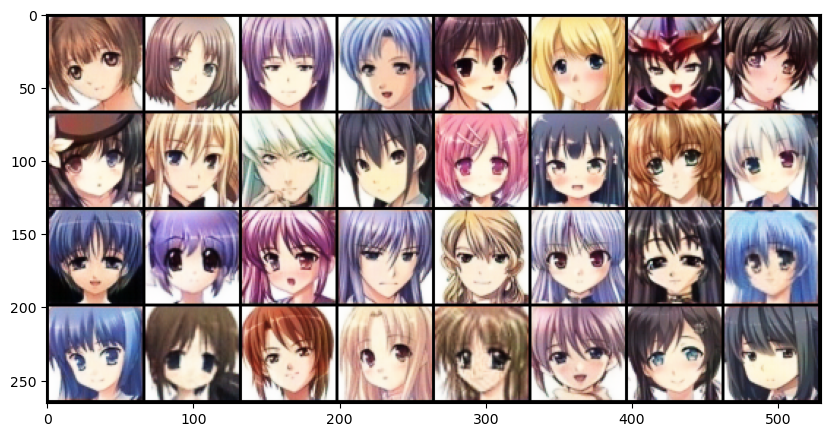

Epoch 66/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 66/100: D Loss:  2.8175, G loss:  2.6183


Epoch 67/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 67/100: D Loss:  2.8868, G loss:  2.6712


Epoch 68/100: 100%|███████████████████████████████████████████████| 124/124 [01:21<00:00,  1.52it/s]


Epoch: 68/100: D Loss:  2.8063, G loss:  2.6036


Epoch 69/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 69/100: D Loss:  2.7887, G loss:  2.5887


Epoch 70/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 70/100: D Loss:  2.7776, G loss:  2.5780


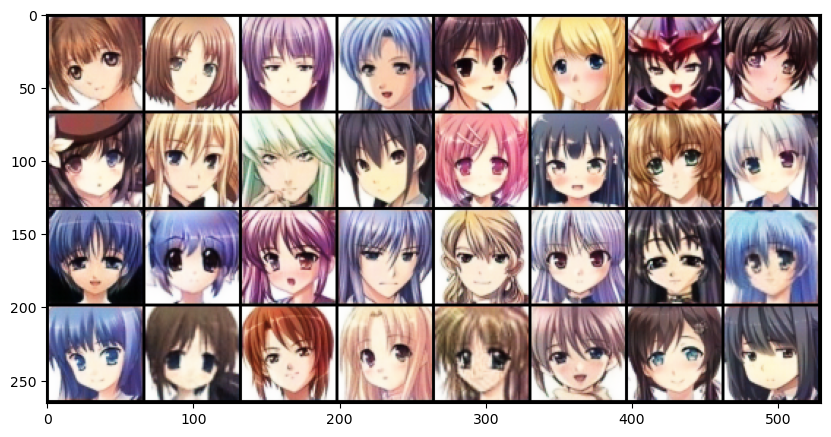

Epoch 71/100: 100%|███████████████████████████████████████████████| 124/124 [01:24<00:00,  1.47it/s]


Epoch: 71/100: D Loss:  2.7766, G loss:  2.5782


Epoch 72/100: 100%|███████████████████████████████████████████████| 124/124 [01:24<00:00,  1.46it/s]


Epoch: 72/100: D Loss:  2.7635, G loss:  2.5630


Epoch 73/100: 100%|███████████████████████████████████████████████| 124/124 [01:25<00:00,  1.45it/s]


Epoch: 73/100: D Loss:  2.7529, G loss:  2.5538


Epoch 74/100: 100%|███████████████████████████████████████████████| 124/124 [01:26<00:00,  1.43it/s]


Epoch: 74/100: D Loss:  2.7376, G loss:  2.5383


Epoch 75/100: 100%|███████████████████████████████████████████████| 124/124 [01:27<00:00,  1.42it/s]


Epoch: 75/100: D Loss:  2.7349, G loss:  2.5349


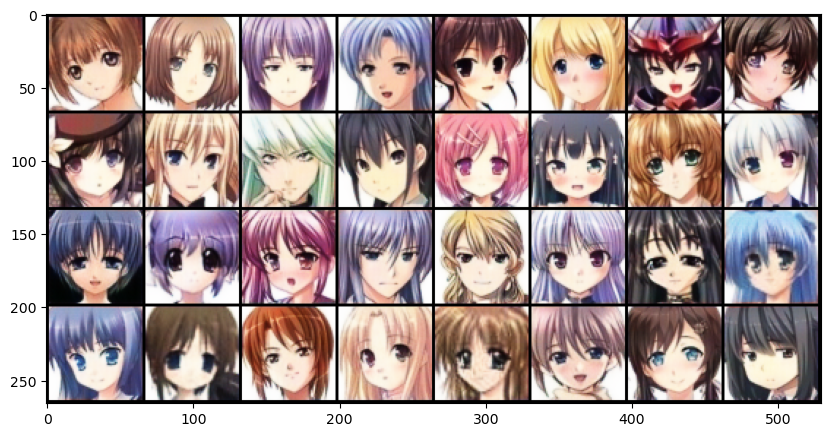

Epoch 76/100: 100%|███████████████████████████████████████████████| 124/124 [01:25<00:00,  1.45it/s]


Epoch: 76/100: D Loss:  2.7313, G loss:  2.5324


Epoch 77/100: 100%|███████████████████████████████████████████████| 124/124 [01:25<00:00,  1.45it/s]


Epoch: 77/100: D Loss:  2.7186, G loss:  2.5192


Epoch 78/100: 100%|███████████████████████████████████████████████| 124/124 [01:26<00:00,  1.43it/s]


Epoch: 78/100: D Loss:  2.7151, G loss:  2.5157


Epoch 79/100: 100%|███████████████████████████████████████████████| 124/124 [01:25<00:00,  1.45it/s]


Epoch: 79/100: D Loss:  2.7060, G loss:  2.5066


Epoch 80/100: 100%|███████████████████████████████████████████████| 124/124 [01:23<00:00,  1.49it/s]


Epoch: 80/100: D Loss:  2.7098, G loss:  2.5110


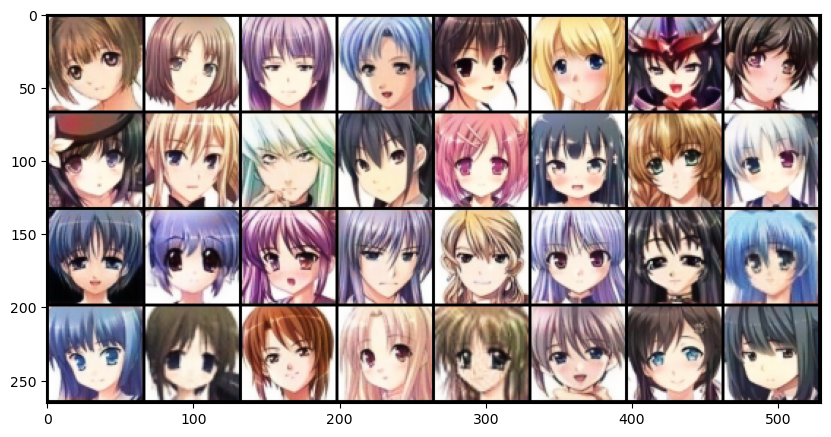

Epoch 81/100:  15%|███████▎                                        | 19/124 [00:14<01:18,  1.33it/s]


KeyboardInterrupt: 

In [10]:

for epoch in range(1, epochs + 1):
    
    gen_model.train()
    dis_model.train()
    
    total_d_loss = 0
    total_g_loss = 0
    
    for gray_images, rgb_images in tqdm(train_dataloader, desc = f'Epoch {epoch}/{epochs}', ncols = 100):
        # Train Discriminator
        ## Train with real image 
        dis_optim.zero_grad()
        gray_images = gray_images.to(device)
        rgb_images = rgb_images.to(device)
          
        #  label smoothing        
        prob_real = dis_model(gray_images, rgb_images)
        
        label_real = Uniform(0.9, 1.0).sample(prob_real.shape).to(device)
        loss_real = BECLoss_func(prob_real, label_real)
        
        ## Train with fake image 
        fake_rgb_images = gen_model(gray_images)
        prob_fake = dis_model(gray_images, fake_rgb_images)
        
        label_fake = Uniform(0., 0.05).sample(prob_fake.shape).to(device)
        loss_fake = BECLoss_func(prob_fake, label_fake)
        
        compare_loss = L1Loss_func(rgb_images, fake_rgb_images)
        
        d_loss = loss_real + loss_fake + lambda_weight * compare_loss
        d_loss.backward()
        dis_optim.step()
        
        
        ## Train Generator
        gen_optim.zero_grad()
        fake_rgb_images = gen_model(gray_images)
        prob_fake = dis_model(gray_images, fake_rgb_images)
        
        label = Uniform(0.95, 1.0).sample(prob_fake.shape).to(device)
        loss_fake = BECLoss_func(prob_fake, label_fake)
        compare_loss = L1Loss_func(rgb_images, fake_rgb_images)
        g_loss = loss_fake + lambda_weight * compare_loss
        g_loss.backward()
        gen_optim.step()
        
        total_d_loss += d_loss
        total_g_loss += g_loss
        
    average_d_loss = total_d_loss.item()/len(train_dataloader) 
    average_g_loss = total_g_loss.item()/len(train_dataloader)
    
    print(f'Epoch: {epoch}/{epochs}: D Loss: {average_d_loss : .4f}, G loss: {average_g_loss : .4f}')

        
    if epoch % 5 == 0:
        with torch.no_grad():
            fake_rgb_images = gen_model(fixed_input.to(device)).detach().cpu()
        fake_rgb_images = make_grid(fake_rgb_images[:32], padding=2, normalize=True)
        img_list.append(fake_rgb_images)
        plt.figure(figsize=(10,10))
        plt.imshow(img_list[-1].permute(1,2,0))
        plt.show()

# Save results

In [11]:
torch.save(dis_model.state_dict(), 'pix2pix_gan_discriminator_weights.pt')
torch.save(gen_model.state_dict(), 'pix2pix_gan_generator_weights.pt')


In [12]:
import imageio

training_progress_images = [np.transpose(255*img_grid.numpy(), (1, 2, 0)).astype(np.uint8) for img_grid in img_list]
imageio.mimsave('coloring_anime_faces_pix2pix.gif', training_progress_images)


In [14]:
os.listdir()

['pix2pix_gan_generator_weights.pt',
 '.virtual_documents',
 'pix2pix_gan_discriminator_weights.pt',
 'coloring_anime_faces_pix2pix.gif',
 '__notebook_source__.ipynb']